In [98]:
##################
# Load libraries #
##################

# from get_strava_data import my_data, process_data, get_elevation

import requests
import os

import pandas as pd
import numpy as np

from PIL import Image
import base64

import ast
import polyline

import matplotlib.pyplot as plt
# import seaborn as sns
import folium
from folium import IFrame
from folium.features import CustomIcon


import plotly.express as px
import plotly.graph_objects as go
from plotly.validators.scatter.marker import SymbolValidator
raw_symbols = SymbolValidator().values
import streamlit as st


In [99]:
print("folium.__version__",folium.__version__)

folium.__version__ 0.12.1.post1


In [143]:
polylines_df = pd.read_csv('../data/processed_data.csv', usecols=['name', 'distance', 'total_elevation_gain', 'average_speed', 'weighted_average_watts', 'suffer_score', 'year', 'month', 'day', 'type', 'map'])
polylines_df = polylines_df[polylines_df.type == 'Ride'] # We'll only use rides which have a map

ride_names = polylines_df.name

option='Errands 🥶'

# We'll choose rides by index to avoid duplicate names 
ride_index = 3
idx = polylines_df[polylines_df.name == option].index.values[0]
decoded = pd.json_normalize(polylines_df[polylines_df.index == idx]['map'].apply(ast.literal_eval))['summary_polyline'].apply(polyline.decode).values[0]


In [144]:
decoded

[(37.78459, -122.29146),
 (37.78199, -122.29142),
 (37.78028, -122.29141),
 (37.78012, -122.29146),
 (37.78012, -122.29152),
 (37.78011, -122.29153),
 (37.77999, -122.29152),
 (37.77988, -122.29152),
 (37.77986, -122.29156),
 (37.77994, -122.29244),
 (37.78003, -122.29416),
 (37.78016, -122.29554),
 (37.7803, -122.29783),
 (37.78036, -122.29847),
 (37.78042, -122.29867),
 (37.78047, -122.29981),
 (37.78047, -122.29988),
 (37.78044, -122.29993),
 (37.7804, -122.29995),
 (37.78036, -122.29994),
 (37.78033, -122.29991),
 (37.78008, -122.29917),
 (37.78007, -122.29902),
 (37.78006, -122.29824),
 (37.78004, -122.29818),
 (37.77984, -122.29806),
 (37.77966, -122.29807),
 (37.77833, -122.2982),
 (37.77798, -122.29828),
 (37.77756, -122.2983),
 (37.7772, -122.2983),
 (37.77695, -122.29832),
 (37.77666, -122.29838),
 (37.7766, -122.29837),
 (37.77648, -122.29837),
 (37.77634, -122.29848),
 (37.77578, -122.29919),
 (37.77548, -122.29953),
 (37.77537, -122.2996),
 (37.77523, -122.29973),
 (37.774

In [145]:
polylines_df

,name,distance,total_elevation_gain,type,map,average_speed,suffer_score,weighted_average_watts,year,month,day
1,Errands 🥶,7.9,170.6,Ride,"{'id': 'a8557237514', 'summary_polyline': 'uxr...",13.6,7.0,NaN,2023,2,13
2,Two Bridges w/ TA,35.2,2467.2,Ride,"{'id': 'a8551377021', 'summary_polyline': 'gff...",14.4,73.0,157.0,2023,2,12
4,Blustery 🌬️ Radler Willkommen 🍻,21.4,2040.7,Ride,"{'id': 'a8540290548', 'summary_polyline': '{{v...",13.0,73.0,171.0,2023,2,10
6,Afternoon Ride,24.2,334.6,Ride,"{'id': 'a8529587715', 'summary_polyline': 'uks...",17.5,98.0,174.0,2023,2,8
10,Wet Radler Willkommen + otter sighting,21.5,1935.7,Ride,"{'id': 'a8501084802', 'summary_polyline': 'o{v...",13.4,60.0,155.0,2023,2,3
...,...,...,...,...,...,...,...,...,...,...,...
900,"06/16/2012 New York, NY",2.4,43.0,Ride,"{'id': 'a11732689', 'summary_polyline': 'okkxF...",10.0,NaN,NaN,2012,6,16
901,"06/03/2012 New York, NY - Tour de Brooklyn",34.8,534.1,Ride,"{'id': 'a11732533', 'summary_polyline': 'gljxF...",9.5,NaN,NaN,2012,6,3
902,"06/02/2012 New York, NY",12.4,283.5,Ride,"{'id': 'a11732479', 'summary_polyline': 'wtlxF...",9.4,NaN,NaN,2012,6,2
903,"05/26/2012 New York, NY",11.9,169.6,Ride,"{'id': 'a11732411', 'summary_polyline': 'spjxF...",9.0,NaN,NaN,2012,5,26


In [146]:

polylines_df['decoded_polyline'] = polylines_df['map'].apply(ast.literal_eval)
polylines_df['decoded_polyline'] = pd.json_normalize(polylines_df['decoded_polyline'])['summary_polyline']
# Dropping row with decoded_polyline = None
polylines_df = polylines_df[polylines_df.decoded_polyline.notnull()]

polylines_df['decoded_polyline'] = polylines_df['decoded_polyline'].apply(polyline.decode)

polylines_df.head()

/var/folders/m_/cblr50wx2yb9cjmjkwhw5rp00000gn/T/ipykernel_48832/1011909907.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,distance,total_elevation_gain,type,map,average_speed,suffer_score,weighted_average_watts,year,month,day,decoded_polyline
1,Errands 🥶,7.9,170.6,Ride,"{'id': 'a8557237514', 'summary_polyline': 'uxr...",13.6,7.0,NaN,2023,2,13,"[(38.04788, -122.22087), (38.04435, -122.21878..."
2,Two Bridges w/ TA,35.2,2467.2,Ride,"{'id': 'a8551377021', 'summary_polyline': 'gff...",14.4,73.0,157.0,2023,2,12,"[(37.80558, -122.43191), (37.80535, -122.43361..."
4,Blustery 🌬️ Radler Willkommen 🍻,21.4,2040.7,Ride,"{'id': 'a8540290548', 'summary_polyline': '{{v...",13.0,73.0,171.0,2023,2,10,"[(37.80552, -122.43202), (37.80533, -122.43369..."
6,Afternoon Ride,24.2,334.6,Ride,"{'id': 'a8529587715', 'summary_polyline': 'uks...",17.5,98.0,174.0,2023,2,8,"[(37.78752, -122.27533), (37.78645, -122.27443..."
10,Wet Radler Willkommen + otter sighting,21.5,1935.7,Ride,"{'id': 'a8501084802', 'summary_polyline': 'o{v...",13.4,60.0,155.0,2023,2,3,"[(37.80553, -122.43237), (37.80538, -122.43365..."


In [94]:
decoded_1 = polylines_df.decoded_polyline.values[1]
decoded_2 = polylines_df.decoded_polyline.values[2]
decoded_3 = polylines_df.decoded_polyline.values[3]


In [14]:
# polylines_df['elevation_profile'] = polylines_df['decoded_polyline'].apply(get_elevation)

In [15]:
# # Adding elevation data from Open Street Map
# elevation_profile = [get_elevation(coord[0], coord[1]) for coord in decoded]
# elevation_profile_feet = [elevation_profile[i] * 3.28084 for i in range(len(elevation_profile))] # Converting elevation to feet

In [16]:
# # Plotting elevation data
# fig, ax = plt.subplots(figsize=(10, 4))
# ax = pd.Series(elevation_profile_feet).rolling(3).mean().plot(
#     ax=ax, 
#     color='red', 
#     legend=False
# )
# ax.set_ylabel('Elevation (ft)')
# ax.axes.xaxis.set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# # Saving plot
# plt.savefig('./data/elevation_profile.png', dpi=300)

In [17]:
all_decoded = polylines_df.decoded_polyline.values
len(all_decoded)

455

In [18]:
# Mapping route with folium

png = '../data/elevation_profile.png'

encoded = base64.b64encode(open(png, 'rb').read())



html = '<img src="data:image/png;base64,{}">'.format
# iframe = IFrame(html(), width=632+20, height=420+20)
# popup = folium.Popup(iframe, max_width=2650)

centroid = [
    np.mean([coord[0] for coord in decoded]), 
    np.mean([coord[1] for coord in decoded])
]

my_map = folium.Map(location=centroid, zoom_start=13)
folium.PolyLine(decoded_1).add_to(my_map)
# folium.PolyLine(d for d in all_decoded).add_to(my_map)

my_map

In [19]:
from folium import plugins
from folium.plugins import HeatMap

all_decoded = [polylines_df.decoded_polyline.values[i] for i in range(len(polylines_df.decoded_polyline.values))]

centroid = [np.mean([coord[0] for coord in all_decoded[0]]), np.mean([coord[1] for coord in all_decoded[0]])]

map = folium.Map(location=centroid, zoom_start=9, tiles='stamentoner')
try:
    for i in range(len(all_decoded)):
        folium.PolyLine(all_decoded[i]).add_to(map)
except:
    pass

# Creating  heatmap layer
# lat_0 = [coord[0] for coord in all_decoded[0]]
# lon_0 = [coord[1] for coord in all_decoded[0]]
# heatmap = HeatMap(list(zip(lat_0, lon_0)), radius=15)

# lat_1 = [coord[0] for coord in all_decoded[1]]
# lon_1 = [coord[1] for coord in all_decoded[1]]
# heatmap1 = HeatMap(list(zip(lat_1, lon_1)), radius=15)

# lat_2 = [coord[0] for coord in all_decoded[2]]
# lon_2 = [coord[1] for coord in all_decoded[2]]
# heatmap2 = HeatMap(list(zip(lat_2, lon_2)), radius=15)

# lat_3 = [coord[0] for coord in all_decoded[3]]
# lon_3 = [coord[1] for coord in all_decoded[3]]
# heatmap3 = HeatMap(list(zip(lat_3, lon_3)), radius=15)

# for i in range(len(all_decoded)):
#     lats = [coord[0] for coord in all_decoded[i]]
#     lons = [coord[1] for coord in all_decoded[i]]

# for lat, lon in zip(lats, lons):
#     heatmap = HeatMap(list(zip([lat], [lon])), radius=15).add_to(map)

# heatmap = HeatMap(list(zip([lat for lat in lats], [lon for lon in lons])), radius=15)
# heatmap.add_to(map)

# heatmap.add_to(map)
# heatmap1.add_to(map)
# heatmap2.add_to(map)
# heatmap3.add_to(map)

map

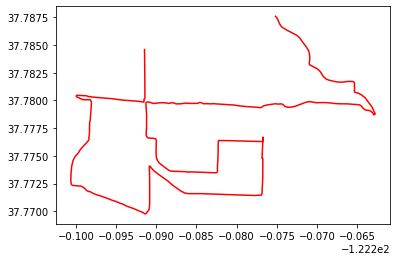

In [20]:
import polyline
import matplotlib.pyplot as plt

summary_polyline = "ij_}Hyjd^dB_Gp@aAn@[F[{BwQpA?p@v@rCQf@m@_@iTSaAe\\cEWVKt@yANs@jCkAfB_JhIdEpP|ApD|BfDl@`DcEvCwEbCcHtKiGnLmKnOcClF{HxLoBrBgG~DmAnBy@pCYxBi@xIHlBu@xH{@tPu@fRLpIS~Eo@lC_HtOuJ|LwOrH{FrH}BdEoChBeBt@{HpBwBpBqA|Ba@K{DeGkKnQc@WkEwGsG~Aj@rBjBjWOhA}AtEc@`Ge\\rZyCbH{@|@Ij@r@hA|BxURf@E`@qJzQy_@fz@uGtG{Cy@}GxAyCrCqAfC{AfHmC|SQtEdAxHpBvGv@`EDbFm@pDo@r@sAl@qGc@}ALgJzIkGhNcDzOkBvHsCpD{EvCaGfBqWtC_FpB_F`FeOdV_HtEsJL{JeCqFaC}D}DkH{FyRiD_B}@cC`@{CyAeC`@}RrK_ErAcDnBuFJmBk@sA{@kAoBgD}Iw@_DK}DnAcBUsCTcIIsDkAkGu@eAiCiGyOoSoE{DqImDqE|@aG{AaH}CwDaD_DmFkCgMgB_GeEyFkV_LgE_AaI{BuARoDrBy@z@_BfDSBqCkLoBwFmBsBmDoAgCIkCxB}CtAsI?iFq@{B^cAYsAoBIcDcBkO}A{BuKcd@{Sq`AmAkH_@aFKuN^gFxAyHtPyj@fBcE|E}OzWk}@~CiHXgE`BoIv@wGj]_jE`AgBtAd@j_@j^bRdNn@|Ab@lFp@rAvJ|GxBr@^l@\\ANm@M_FJgu@l@mI`AsHfEeU`BsEjFcKxKoM|FwE~CcB`Cl@|DfH|CjGrInS`EzLnEjSrNb~@hHjc@jBnRzFv~@fCjf@jAn\\N|Ge@r}@L|Fj@t@tAXxPhBdeAkG`Du@M{DmHog@u@gDDiA`^cSdWmP|[e\\fDaE|HaGxB{D|FeO?e@_@u@sZue@YcBxOyl@nFiVtGqVnTir@r@gBd@e@VuCxCkJIgEfGyiAdAwZe@w@kQ{LYy@zDyWvDoRd@_A~zAfq@|q@l_@l@FnBaBfBe@fVvL`AxAt@tB^kEnBKlBf@~AhAr@`Av@zBtEeBfAyElAg@hGnA`B|@jBnBp@`AXbAAzDr@fCC`D`@lG\\NXfC`C`Fl@rBtGnc@Et@cA`Bn@`CyApDxBzD~@lCvCvBtEj]xBpKGp@aFnJ?b@~GpXdBdE~BnD|AxHxC~Dr@ItEdAzB_@"

coordinates = polyline.decode(summary_polyline)

ride_longitudes = [coordinate[1] for coordinate in decoded]
ride_latitudes = [coordinate[0] for coordinate in decoded]

plt.plot(ride_longitudes, ride_latitudes, 'r-', alpha=1)
plt.show()

In [21]:
# from mpl_toolkits.basemap import Basemap

# summary_polyline = "ij_}Hyjd^dB_Gp@aAn@[F[{BwQpA?p@v@rCQf@m@_@iTSaAe\\cEWVKt@yANs@jCkAfB_JhIdEpP|ApD|BfDl@`DcEvCwEbCcHtKiGnLmKnOcClF{HxLoBrBgG~DmAnBy@pCYxBi@xIHlBu@xH{@tPu@fRLpIS~Eo@lC_HtOuJ|LwOrH{FrH}BdEoChBeBt@{HpBwBpBqA|Ba@K{DeGkKnQc@WkEwGsG~Aj@rBjBjWOhA}AtEc@`Ge\\rZyCbH{@|@Ij@r@hA|BxURf@E`@qJzQy_@fz@uGtG{Cy@}GxAyCrCqAfC{AfHmC|SQtEdAxHpBvGv@`EDbFm@pDo@r@sAl@qGc@}ALgJzIkGhNcDzOkBvHsCpD{EvCaGfBqWtC_FpB_F`FeOdV_HtEsJL{JeCqFaC}D}DkH{FyRiD_B}@cC`@{CyAeC`@}RrK_ErAcDnBuFJmBk@sA{@kAoBgD}Iw@_DK}DnAcBUsCTcIIsDkAkGu@eAiCiGyOoSoE{DqImDqE|@aG{AaH}CwDaD_DmFkCgMgB_GeEyFkV_LgE_AaI{BuARoDrBy@z@_BfDSBqCkLoBwFmBsBmDoAgCIkCxB}CtAsI?iFq@{B^cAYsAoBIcDcBkO}A{BuKcd@{Sq`AmAkH_@aFKuN^gFxAyHtPyj@fBcE|E}OzWk}@~CiHXgE`BoIv@wGj]_jE`AgBtAd@j_@j^bRdNn@|Ab@lFp@rAvJ|GxBr@^l@\\ANm@M_FJgu@l@mI`AsHfEeU`BsEjFcKxKoM|FwE~CcB`Cl@|DfH|CjGrInS`EzLnEjSrNb~@hHjc@jBnRzFv~@fCjf@jAn\\N|Ge@r}@L|Fj@t@tAXxPhBdeAkG`Du@M{DmHog@u@gDDiA`^cSdWmP|[e\\fDaE|HaGxB{D|FeO?e@_@u@sZue@YcBxOyl@nFiVtGqVnTir@r@gBd@e@VuCxCkJIgEfGyiAdAwZe@w@kQ{LYy@zDyWvDoRd@_A~zAfq@|q@l_@l@FnBaBfBe@fVvL`AxAt@tB^kEnBKlBf@~AhAr@`Av@zBtEeBfAyElAg@hGnA`B|@jBnBp@`AXbAAzDr@fCC`D`@lG\\NXfC`C`Fl@rBtGnc@Et@cA`Bn@`CyApDxBzD~@lCvCvBtEj]xBpKGp@aFnJ?b@~GpXdBdE~BnD|AxHxC~Dr@ItEdAzB_@"

# coordinates = polyline.decode(summary_polyline)

# ride_longitudes = [coordinate[1] for coordinate in decoded]
# ride_latitudes = [coordinate[0] for coordinate in decoded]

# m = Basemap(
#     llcrnrlon=min(ride_longitudes) - 0.02,
#     llcrnrlat=min(ride_latitudes) - 0.02,
#     urcrnrlon=max(ride_longitudes) + 0.02, 
#     urcrnrlat=max(ride_latitudes) + 0.02,
#     epsg=23095,
# )

# m.arcgisimage(service="World_Imagery", verbose=True)
# x, y = m(ride_longitudes, ride_latitudes)
# m.plot(x, y, 'r-')

# plt.show()

In [22]:


# # Creating a folium map with all decoded polylines
# my_map = folium.Map(location=centroid, zoom_start=13)
# for i in range(len(all_decoded)):
#     folium.PolyLine(all_decoded[i]).add_to(my_map)


In [23]:

# lat = [coord[0] for coord in decoded] 
# lon = [coord[1] for coord in decoded]


# token = MAPBOX_TOKEN = st.secrets['MAPBOX_TOKEN']

# fig = go.Figure(go.Scattermapbox(
#     mode = "lines",
#     lon = lon, lat = lat,
#     marker = dict(size = 2, color = "red"),
#     line = dict(color = "midnightblue", width = 3),
#     # text = '‣',
#     textfont=dict(color='#E58606'),
#     textposition = 'bottom center',))
# fig.update_traces(hovertext='', selector=dict(type='scattermapbox'))
# fig.update_layout(
#     mapbox = {
#         'accesstoken': token,
#         'style': "outdoors", 'zoom': 12,
#         'center': {'lon': centroid[1], 'lat': centroid[0]}
#     },
#     margin = {'l': 0, 'r': 0, 't': 0, 'b': 0},
#     showlegend = False,
#     mapbox_style="light")
    

# fig.show()

In [ ]:
name = polylines_df[polylines_df.index == 3]['name'].values[0]
distance = polylines_df[polylines_df.index == 3]['distance'].values[0]
elev_gain = polylines_df[polylines_df.index == 3]['total_elevation_gain'].values[0]
avg_speed = polylines_df[polylines_df.index == 3]['average_speed'].values[0]
avg_power = polylines_df[polylines_df.index == 3]['weighted_average_watts'].values[0] 
suffer = polylines_df[polylines_df.index == 3]['suffer_score'].values[0]

fig = px.line(elevation_profile_feet, x=range(len(elevation_profile_feet)), y=pd.Series(elevation_profile_feet).rolling(5).mean())
fig.update_layout(
        xaxis=dict(
            showline=True,
            showgrid=True,
            showticklabels=False,
            linecolor='rgb(204, 204, 204)',
            linewidth=1,
            ticks='',
            tickfont=dict(
                family='Arial',
                size=12,
                color='rgb(82, 82, 82)',
            ),
        ),
        yaxis=dict(
            showgrid=False,
            zeroline=False,
            showline=False,
            gridcolor = 'rgb(235, 236, 240)',
            showticklabels=True,
            title='Elevation (ft)',
            autorange=False,
            range=[0, 2000],
        ),
        autosize=True,
        hovermode="x unified",
        showlegend=False,
        plot_bgcolor='rgba(0,0,0,0)',
        xaxis_title='',
        margin=dict(l=0, r=0, t=0, b=0),
    )
fig.add_annotation(text=f"<b>RIDE STATS</b>--------------------", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.99,
)
fig.add_annotation(text=f"<b>Name</b>: {name}", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.95,
)                    
fig.add_annotation(text=f"<b>Distance</b>: {distance} miles", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.91,
)
fig.add_annotation(text=f"<b>Elevation Gain</b>: {elev_gain} feet", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.87,
)
fig.add_annotation(text=f"<b>Average Speed</b>: {avg_speed} mph", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.83,
)     
fig.add_annotation(text=f"<b>Weighted Power</b>: {avg_power} Watts", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.79,
)
fig.add_annotation(text=f"<b>Suffer Score</b>: {suffer.astype(int)}", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.75,
)  
fig.add_annotation(text="----------------------------------", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.71,
)


fig.show()

In [ ]:
# TESTING GOOGLE API KEY #

import requests
import streamlit as st
GOOGLE_API_KEY = st.secrets['GOOGLE_API_KEY']



lat = 37.7749
lon = -122.4194


def get_elev_data_GOOGLE(lat, lon):
    url = f"https://maps.googleapis.com/maps/api/elevation/json?locations={lat}%2C{lon}&key={GOOGLE_API_KEY}"

    payload={}
    headers = {}

    response = requests.request("GET", url, headers=headers, data=payload)
    response = ast.literal_eval(response.text)
    elevation = response['results'][0]['elevation']
    elevation_feet = elevation * 3.28084

    return elevation_feet

In [ ]:
# Using google API to get elevation data for all points in polyline
elevation_profile_google = [get_elev_data_GOOGLE(coord[0], coord[1]) for coord in decoded]

In [ ]:
elevation_profile_google

In [ ]:
name = polylines_df[polylines_df.index == 3]['name'].values[0]
distance = polylines_df[polylines_df.index == 3]['distance'].values[0]
elev_gain = polylines_df[polylines_df.index == 3]['total_elevation_gain'].values[0]
avg_speed = polylines_df[polylines_df.index == 3]['average_speed'].values[0]
avg_power = polylines_df[polylines_df.index == 3]['weighted_average_watts'].values[0] 
suffer = polylines_df[polylines_df.index == 3]['suffer_score'].values[0]

fig = px.line(elevation_profile_google, x=range(len(elevation_profile_google)), y=pd.Series(elevation_profile_google).rolling(5).mean())
fig.update_layout(
        xaxis=dict(
            showline=True,
            showgrid=True,
            showticklabels=False,
            linecolor='rgb(204, 204, 204)',
            linewidth=1,
            ticks='',
            tickfont=dict(
                family='Arial',
                size=12,
                color='rgb(82, 82, 82)',
            ),
        ),
        yaxis=dict(
            showgrid=False,
            zeroline=False,
            showline=False,
            gridcolor = 'rgb(235, 236, 240)',
            showticklabels=True,
            title='Elevation (ft)',
            autorange=False,
            range=[0, 2000],
        ),
        autosize=True,
        hovermode="x unified",
        showlegend=False,
        plot_bgcolor='rgba(0,0,0,0)',
        xaxis_title='',
        margin=dict(l=0, r=0, t=0, b=0),
    )
fig.add_annotation(text=f"<b>RIDE STATS</b>--------------------", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.99,
)
fig.add_annotation(text=f"<b>Name</b>: {name}", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.95,
)                    
fig.add_annotation(text=f"<b>Distance</b>: {distance} miles", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.91,
)
fig.add_annotation(text=f"<b>Elevation Gain</b>: {elev_gain} feet", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.87,
)
fig.add_annotation(text=f"<b>Average Speed</b>: {avg_speed} mph", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.83,
)     
fig.add_annotation(text=f"<b>Weighted Power</b>: {avg_power} Watts", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.79,
)
fig.add_annotation(text=f"<b>Suffer Score</b>: {suffer.astype(int)}", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.75,
)  
fig.add_annotation(text="----------------------------------", 
                    align='left',
                    showarrow=False,
                    xref='paper',
                    yref='paper',
                    x=0.05,
                    y=0.71,
)


fig.show()

In [24]:
# Mapping route with folium

png = '../data/elevation_profile.png'

encoded = base64.b64encode(open(png, 'rb').read())



html = '<img src="data:image/png;base64,{}">'.format
# iframe = IFrame(html(), width=632+20, height=420+20)
# popup = folium.Popup(iframe, max_width=2650)

centroid = [
    np.mean([coord[0] for coord in decoded]), 
    np.mean([coord[1] for coord in decoded])
]

my_map = folium.Map(location=centroid, zoom_start=13)
# Adding all decoded points to map
folium.PolyLine(decoded for coord in decoded).add_to(my_map)

# folium.PolyLine(decoded).add_to(my_map)

my_map

In [25]:
polylines_df.head()

,name,distance,total_elevation_gain,type,map,average_speed,suffer_score,weighted_average_watts,year,month,day,decoded_polyline
1,Errands 🥶,7.9,170.6,Ride,"{'id': 'a8557237514', 'summary_polyline': 'uxr...",13.6,7.0,NaN,2023,2,13,"[(38.04788, -122.22087), (38.04435, -122.21878..."
2,Two Bridges w/ TA,35.2,2467.2,Ride,"{'id': 'a8551377021', 'summary_polyline': 'gff...",14.4,73.0,157.0,2023,2,12,"[(37.80558, -122.43191), (37.80535, -122.43361..."
4,Blustery 🌬️ Radler Willkommen 🍻,21.4,2040.7,Ride,"{'id': 'a8540290548', 'summary_polyline': '{{v...",13.0,73.0,171.0,2023,2,10,"[(37.80552, -122.43202), (37.80533, -122.43369..."
6,Afternoon Ride,24.2,334.6,Ride,"{'id': 'a8529587715', 'summary_polyline': 'uks...",17.5,98.0,174.0,2023,2,8,"[(37.78752, -122.27533), (37.78645, -122.27443..."
10,Wet Radler Willkommen + otter sighting,21.5,1935.7,Ride,"{'id': 'a8501084802', 'summary_polyline': 'o{v...",13.4,60.0,155.0,2023,2,3,"[(37.80553, -122.43237), (37.80538, -122.43365..."


In [ ]:


# import pandas as pd
# quakes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv')

# all_lats = [lat for lat in polylines_df['lat'].values]
# all_lons = [lon for lon in polylines_df['lon'].values]

# [lat[i] for lat in all_lats for i in range(len(lat))]
# [lon[i] for lon in all_lons for i in range(len(lon))]

# z = polylines_df.average_speed.values

# import plotly.graph_objects as go
# fig = go.Figure(go.Scattermapbox(lat=[lat[i] for lat in all_lats for i in range(len(lat))], lon=[lon[i] for lon in all_lons for i in range(len(lon))], mode='markers', marker=go.scattermapbox.Marker(size=5)))
# fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=90)
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

In [ ]:
# import pandas as pd
# quakes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv')

# import plotly.graph_objects as go
# fig = go.Figure(go.Densitymapbox(lat=quakes.Latitude, lon=quakes.Longitude, z=quakes.Magnitude,
#                                  radius=10))
# fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

In [135]:
# Creating an empty row between each row
idx = pd.RangeIndex(start=0, stop=len(polylines_df)*2, step=1)
new_df = pd.DataFrame(None, index=idx, columns=polylines_df.columns)
ids = np.arange(0, len(polylines_df)*2, 2)
new_df.iloc[ids] = polylines_df
new_df.head()

,name,distance,total_elevation_gain,type,map,average_speed,suffer_score,weighted_average_watts,year,month,day,decoded_polyline,lat,lon
0,Errands 🥶,7.9,170.6,Ride,"{'id': 'a8557237514', 'summary_polyline': 'uxr...",13.6,7.0,NaN,2023,2,13,"[(38.04788, -122.22087), (38.04435, -122.21878...","[38.04788, 38.04435, 38.04362, 38.042, 38.0410...","[-122.22087, -122.21878, -122.21806, -122.2159..."
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Two Bridges w/ TA,35.2,2467.2,Ride,"{'id': 'a8551377021', 'summary_polyline': 'gff...",14.4,73.0,157.0,2023,2,12,"[(37.80558, -122.43191), (37.80535, -122.43361...","[37.80558, 37.80535, 37.80513, 37.80651, 37.80...","[-122.43191, -122.43361, -122.43391, -122.4361..."
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Blustery 🌬️ Radler Willkommen 🍻,21.4,2040.7,Ride,"{'id': 'a8540290548', 'summary_polyline': '{{v...",13.0,73.0,171.0,2023,2,10,"[(37.80552, -122.43202), (37.80533, -122.43369...","[37.80552, 37.80533, 37.80514, 37.80646, 37.80...","[-122.43202, -122.43369, -122.43389, -122.436,..."


In [136]:
polylines_df = new_df.copy()
polylines_df.head()

,name,distance,total_elevation_gain,type,map,average_speed,suffer_score,weighted_average_watts,year,month,day,decoded_polyline,lat,lon
0,Errands 🥶,7.9,170.6,Ride,"{'id': 'a8557237514', 'summary_polyline': 'uxr...",13.6,7.0,NaN,2023,2,13,"[(38.04788, -122.22087), (38.04435, -122.21878...","[38.04788, 38.04435, 38.04362, 38.042, 38.0410...","[-122.22087, -122.21878, -122.21806, -122.2159..."
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Two Bridges w/ TA,35.2,2467.2,Ride,"{'id': 'a8551377021', 'summary_polyline': 'gff...",14.4,73.0,157.0,2023,2,12,"[(37.80558, -122.43191), (37.80535, -122.43361...","[37.80558, 37.80535, 37.80513, 37.80651, 37.80...","[-122.43191, -122.43361, -122.43391, -122.4361..."
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Blustery 🌬️ Radler Willkommen 🍻,21.4,2040.7,Ride,"{'id': 'a8540290548', 'summary_polyline': '{{v...",13.0,73.0,171.0,2023,2,10,"[(37.80552, -122.43202), (37.80533, -122.43369...","[37.80552, 37.80533, 37.80514, 37.80646, 37.80...","[-122.43202, -122.43369, -122.43389, -122.436,..."


In [175]:
all_decoded = [polylines_df.decoded_polyline.values[i] for i in range(len(polylines_df.decoded_polyline.values))]
all_decoded[0][1]


(38.04435, -122.21878)

In [158]:
import plotly.express as px
MAPBOX_TOKEN = 'pk.eyJ1IjoidGlyb2dlciIsImEiOiJjancxNHNkdGMwN2E4NDNtemt3dDM1ZDJ0In0.CJVEsnLNqQXM74U5VLPTEA'

# New column with latitudes
polylines_df['lat'] = polylines_df['decoded_polyline'].apply(lambda x: [coord[0] for coord in x])
# New column with longitudes
polylines_df['lon'] = polylines_df['decoded_polyline'].apply(lambda x: [coord[1] for coord in x])

# Creating an empty row between each row
# idx = pd.RangeIndex(start=0, stop=len(polylines_df), step=2)
# new_df = pd.DataFrame(np.nan, index=idx, columns=polylines_df.columns)
# ids = pd.arrange(0, len(polylines_df), 2)
# new_df.iloc[ids] = polylines_df

all_lats = [lat for lat in polylines_df['lat'].values]
all_lons = [lon for lon in polylines_df['lon'].values]

[lat[i] for lat in all_lats for i in range(len(lat))]
[lon[i] for lon in all_lons for i in range(len(lon))]

home_coordinates = [37.7799, 122.2822]

list_of_lats = [lat for lat in polylines_df['lat'].values]
list_of_lons = [lon for lon in polylines_df['lon'].values]

fig = px.scatter_mapbox(polylines_df, lat=[lat[i] for lat in all_lats for i in range(len(lat))], lon=[lon[i] for lon in all_lons for i in range(len(lon))],
                        color_discrete_sequence=["blue"], zoom=8, height=1200, center=dict(lat=home_coordinates[0], lon=-home_coordinates[1]))

fig.update_layout(mapbox_style="dark", mapbox_accesstoken=MAPBOX_TOKEN)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

/var/folders/m_/cblr50wx2yb9cjmjkwhw5rp00000gn/T/ipykernel_48832/347785744.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/m_/cblr50wx2yb9cjmjkwhw5rp00000gn/T/ipykernel_48832/347785744.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [168]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox())

# Adding a trace for each row in the dataframe
for i in range(len(polylines_df)):
    fig.add_trace(go.Scattermapbox(mode='lines', lat=polylines_df.lat.values[i], lon=polylines_df.lon.values[i]))

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0})
fig.update_layout(mapbox_accesstoken=MAPBOX_TOKEN)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                  showlegend=False,
                  mapbox = {
                      'style': 'dark',
                      'center': {'lon': -home_coordinates[1], 'lat': home_coordinates[0]},
                      'zoom': 8
                  })
fig.update_traces(line_color='blue', line_width=2)
fig.show()

In [28]:
# Creating a datafram where each row contains all the latitudes and longitudes for a given ride
ride_coordinates_df = pd.DataFrame((list_of_lats, list_of_lons)).T
# Renaming columns
ride_coordinates_df.columns = ['lat', 'lon']
ride_coordinates_df

,lat,lon
0,"[38.04788, 38.04435, 38.04362, 38.042, 38.0410...","[-122.22087, -122.21878, -122.21806, -122.2159..."
1,"[37.80558, 37.80535, 37.80513, 37.80651, 37.80...","[-122.43191, -122.43361, -122.43391, -122.4361..."
2,"[37.80552, 37.80533, 37.80514, 37.80646, 37.80...","[-122.43202, -122.43369, -122.43389, -122.436,..."
3,"[37.78752, 37.78645, 37.78553, 37.78437, 37.78...","[-122.27533, -122.27443, -122.27226, -122.2712..."
4,"[37.80553, 37.80538, 37.80515, 37.80643, 37.80...","[-122.43237, -122.43365, -122.43391, -122.4359..."
...,...,...
450,"[40.8596, 40.8598, 40.8643, 40.8658, 40.8688, ...","[-73.9319, -73.9311, -73.9295, -73.9267, -73.9..."
451,"[40.8546, 40.85049, 40.85009, 40.8472, 40.8417...","[-73.9346, -73.9365, -73.9358, -73.93811, -73...."
452,"[40.8662, 40.8661, 40.8652, 40.8637, 40.8618, ...","[-73.9279, -73.9284, -73.9279, -73.9299, -73.9..."
453,"[40.8553, 40.8454, 40.84279, 40.8416, 40.8409,...","[-73.93681, -73.9404, -73.942, -73.9417, -73.9..."


In [35]:
# Creating a new column removing the brackets
ride_coordinates_df['lat'] = ride_coordinates_df['lat'].apply(lambda x: str(x).replace('[', '').replace(']', ''))
ride_coordinates_df['lon'] = ride_coordinates_df['lon'].apply(lambda x: str(x).replace('[', '').replace(']', ''))
ride_coordinates_df

,lat,lon
0,"38.04788, 38.04435, 38.04362, 38.042, 38.04104...","-122.22087, -122.21878, -122.21806, -122.21599..."
1,"37.80558, 37.80535, 37.80513, 37.80651, 37.806...","-122.43191, -122.43361, -122.43391, -122.43611..."
2,"37.80552, 37.80533, 37.80514, 37.80646, 37.806...","-122.43202, -122.43369, -122.43389, -122.436, ..."
3,"37.78752, 37.78645, 37.78553, 37.78437, 37.783...","-122.27533, -122.27443, -122.27226, -122.27127..."
4,"37.80553, 37.80538, 37.80515, 37.80643, 37.806...","-122.43237, -122.43365, -122.43391, -122.43595..."
...,...,...
450,"40.8596, 40.8598, 40.8643, 40.8658, 40.8688, 4...","-73.9319, -73.9311, -73.9295, -73.9267, -73.91..."
451,"40.8546, 40.85049, 40.85009, 40.8472, 40.8417,...","-73.9346, -73.9365, -73.9358, -73.93811, -73.9..."
452,"40.8662, 40.8661, 40.8652, 40.8637, 40.8618, 4...","-73.9279, -73.9284, -73.9279, -73.9299, -73.93..."
453,"40.8553, 40.8454, 40.84279, 40.8416, 40.8409, ...","-73.93681, -73.9404, -73.942, -73.9417, -73.93..."


In [47]:
# Adding a np None at the end of each row
ride_coordinates_df['lat'] = ride_coordinates_df['lat'].apply(lambda x: x + ', None')
ride_coordinates_df['lon'] = ride_coordinates_df['lon'].apply(lambda x: x + ', None')

all_lats = [lat for lat in ride_coordinates_df['lat'].values]
all_lons = [lon for lon in ride_coordinates_df['lon'].values]

In [37]:
# lats_list = []
# lon_list = []

# for i in range(len(ride_coordinates_df)):
#     lats_list.append(ride_coordinates_df['lat'][i].split(', '))
#     lon_list.append(ride_coordinates_df['lon'][i].split(', '))

In [ ]:
# Converting the rows to an array and separating each row with "none" value
lat_array = np.array(ride_coordinates_df['lat'])

In [49]:
# Creating a scattermapbox figure
fig = px.scatter_mapbox(lat=all_lats, lon=all_lons, color_discrete_sequence=["blue"], zoom=8, height=1200, center=dict(lat=home_coordinates[0], lon=-home_coordinates[1]))
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=MAPBOX_TOKEN)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [39]:
fig = px.line_mapbox(lat=lats, lon=lons, zoom=8, height=1200, center=dict(lat=home_coordinates[0], lon=-home_coordinates[1]))
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=MAPBOX_TOKEN)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
ride_coordinates_df.lat


In [ ]:
import plotly.express as px
import geopandas as gpd
import shapely.geometry
import numpy as np
import wget

# download a zipped shapefile
wget.download("https://plotly.github.io/datasets/ne_50m_rivers_lake_centerlines.zip")

# open a zipped shapefile with the zip:// pseudo-protocol
geo_df = gpd.read_file("zip://ne_50m_rivers_lake_centerlines.zip")

lats = []
lons = []
names = []

for feature, name in zip(geo_df.geometry, geo_df.name):
    if isinstance(feature, shapely.geometry.linestring.LineString):
        linestrings = [feature]
    elif isinstance(feature, shapely.geometry.multilinestring.MultiLineString):
        linestrings = feature.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        names = np.append(names, [name]*len(y))
        lats = np.append(lats, None)
        lons = np.append(lons, None)
        names = np.append(names, None)

fig = px.line_mapbox(lat=lats, lon=lons, hover_name=names,
                     mapbox_style="stamen-terrain", zoom=1)
fig.show()

In [ ]:
print(lats)

In [ ]:
# Removing the brackets from the lat and lon columns
ride_coordinates_df.head()

all_lats = []
all_lons = []

for lat, lon in zip(ride_coordinates_df.lat, ride_coordinates_df.lon):
    all_lats.append(lat)
    all_lons.append(lon)

In [40]:
lats

array(['38.04788, 38.04435, 38.04362, 38.042, 38.04104, 38.04026, 38.04, 38.0398, 38.03936, 38.03864, 38.0384, 38.03808, 38.03692, 38.03636, 38.03596, 38.03554, 38.03523, 38.03499, 38.03484, 38.03507, 38.03667, 38.03699, 38.03692, 38.03651, 38.03555, 38.03276, 38.02856, 38.02783, 38.02714, 38.02596, 38.02512, 38.02317, 38.02265, 38.02202, 38.02005, 38.01915, 38.01843, 38.01766, 38.01707, 38.01597, 38.01426, 38.01414, 38.01408, 38.01424, 38.01527, 38.01571, 38.01586, 38.01586, 38.01538, 38.01514, 38.01463, 38.01331, 38.01185, 38.00978, 38.00738, 38.00689, 38.00617, 38.00359, 38.0015, 38.00077, 38.00001, 37.99952, 37.99926, 37.99891, 37.99775, 37.99778, 37.99728, 37.99703, 37.99687, 37.99608, 37.99547, 37.99519, 37.99382, 37.99153, 37.9911, 37.98939, 37.98808, 37.98807, 37.9887, 37.98949, 37.98977, 37.98997, 37.98986, 37.98935, 37.98925, 37.98747, 37.9841, 37.98365, 37.98337, 37.98328, 37.9832, 37.98302, 37.98277, 37.98289, 37.98239, 37.98218, 37.98226, 37.982, 37.98203, 37.98289, 37.982

In [ ]:
lats